<a href="https://www.kaggle.com/code/tejasrao01/facial-attractiveness?scriptVersionId=180011335" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

# import numpy as np # linear algebra
# import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

# import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# SCUT-FBP5500 Dataset Analysis and Model Training

### In this notebook, the SCUT-FBP5500 dataset was explored and a model was trained to predict the facial attractiveness given an image. 


## Overview
### The SCUT-FBP5500 dataset has totally 5500 frontal faces with diverse properties (male/female, Asian/Caucasian, ages) and diverse labels (facial landmarks, beauty scores in 5 scales, beauty score distribution)
### This allows different computational model with different facial beauty prediction paradigms, such as appearance-based/shape-based facial beauty classification/regression/ranking model for male/female of Asian/Caucasian.
### This project uses the following research paper as a reference for implementing and training the model: [Facial Beauty Prediction Using Deep Learning](https://www.sciencedirect.com/science/article/pii/S0950705122000740).

## Import Libraries

### Importing the necessary libraries for data manipulation, image processing, and deep learning.


In [2]:
import numpy as np
import pandas as pd
import os
import cv2
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models, transforms
from torch.utils.data import Dataset, DataLoader, random_split
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt
from PIL import Image
import tqdm
from tqdm import tqdm
import albumentations as A
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt


## Load and Explore Dataset

### Loading the SCUT-FBP5500 dataset and visualizing the data to understand its structure.


In [3]:
# Set path to dataset
image_folder = '/kaggle/input/scut-fbp5500-v2-facial-beauty-scores/Images/Images'
label_file = '/kaggle/input/scut-fbp5500-v2-facial-beauty-scores/labels.txt'

# Load labels
df = pd.read_csv(label_file, delimiter=' ',names=['image_name', 'score'], header = None)

# Printing the length of the df 
print(f"Size of the dataframe : {len(df)}")

# Display the first few rows of the dataframe
df.head()

Size of the dataframe : 5500


,image_name,score
0,CF437.jpg,2.883333
1,AM1384.jpg,2.466667
2,AM1234.jpg,2.150000
3,AM1774.jpg,3.750000
4,CF215.jpg,3.033333


### Visualizing 5 Faces from least attractive to most attractive

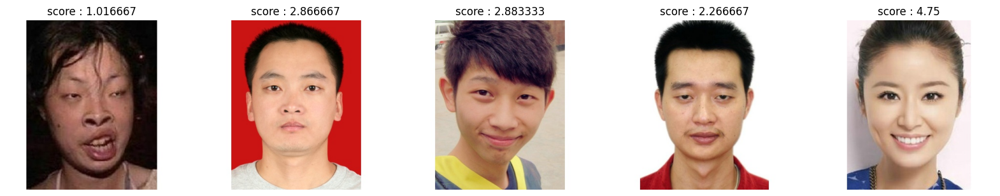

In [4]:
# Visualizing the dataset 

# Choosing 3 random indices + the ones with best and worst scores 

min_index = df['score'].idxmin()
max_index = df['score'].idxmax()
random_indices = np.random.randint(0, len(df) +1, 3)
indices = [min_index, *random_indices, max_index]

fig, axs = plt.subplots(1,5, figsize= (20,20))
for i, idx in enumerate(indices):
    image_path = os.path.join(image_folder, df.iloc[idx, 0])
    image = Image.open(image_path).convert('RGB')
    axs[i].imshow(image)
    axs[i].axis('off')
    axs[i].set_title(f'score : {df.iloc[idx, 1]}')
    
plt.axis('off')
plt.show()

## Data Preprocessing 
### The images provided by the SCUT-fbp5500 Dataset are all 350-350 RGB images. However, as seen above, there is a lot of blank space in several images. 
### Therefore, the images are pre-processed by cropping out the face and resizing the images. 
### This is achieved by using the MTCNN model given in pytorch. 

In [5]:
# # Data Preprocessing whl
# !pip install mtcnn
# import cv2
# import mtcnn

# from mtcnn.mtcnn import MTCNN

In [6]:
# model = MTCNN()

In [7]:
# save_path = '/kaggle/working/ProcessedDataset/Images/Images'
# if not os.path.exists(save_path):
#     os.makedirs(save_path)

# def preprocess():
#     index = 0 
#     for index in tqdm(range(0, len(df))):
#         image_path = os.path.join(image_folder, df.iloc[index, 0])
#         image = cv2.imread(image_path)
#         image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
#         bboxes = model.detect_faces(image);
#         for box in bboxes:
#             x1, y1, w, h = box['box']
#         x_min, x_max, y_min, y_max = x1, x1+w, y1, y1+h
#         cropped_image = image[y_min:y_max, x_min:x_max]
#         image_save_path = os.path.join(save_path, df.iloc[index, 0])
#         cv2.imwrite(image_save_path, cropped_image)

# preprocess()


### The images were processed in a seperate session, and are directly loaded in order to save time.

In [8]:
# Import the preprocessed dataset 

!git clone https://github.com/Tejas-Rao01/facial-attractiveness

Cloning into 'facial-attractiveness'...
remote: Enumerating objects: 10988, done.
remote: Total 10988 (delta 0), reused 0 (delta 0), pack-reused 10988
Receiving objects: 100% (10988/10988), 157.38 MiB | 42.01 MiB/s, done.
Resolving deltas: 100% (5/5), done.


In [9]:
# Set path to dataset
image_folder = '/kaggle/working/facial-attractiveness/preprocessed_dataset/Images/Images'
current_images = set(os.listdir(image_folder))

df_filtered = df[df['image_name'].isin(current_images)]

print(len(df_filtered))    
df = df_filtered.copy()
print(len(df))


5479
5479


## Define Dataset Class

### The Dataset class is now defined. The class returns the images for the two branches of the models along with scores (view model section for details). 
### Because the two branches require different image sizes, the dataset images are resized accordingly.


In [10]:
# Defining Dataset Class

class SCUTDataset(Dataset):
    def __init__(self, df, image_dir, transform=None):
        self.df = df
        self.image_dir = image_dir
        self.transform = transform
        

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        
        image_path = os.path.join(self.image_dir, self.df.iloc[idx, 0])
        image = cv2.imread(image_path)
        image1 = cv2.resize(image, (256, 256))
        image2 = cv2.resize(image, (299, 299))
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        score = self.df.iloc[idx, 1]
        
        if self.transform:
            augmented1 = self.transform(image=image1)
            augmented2 = self.transform(image=image2)
            image1 = augmented1['image']
            image2 = augmented2['image']
        
        image1 = image1.transpose(2, 0, 1)
        image2 = image2.transpose(2, 0, 1)
        
        image1 = torch.tensor(image1, dtype=torch.float32) / 255.0
        image2 = torch.tensor(image2, dtype=torch.float32) / 255.0
        
        score = torch.tensor(self.df.iloc[idx, 1], dtype=torch.float32)
        return image1, image2, score

## Define Transformations

#### The Albumentations library is used to define data augmentation transform for training and simple transformations for testing.


In [11]:
# Defining the transform 
transform_train = A.Compose([
    A.RandomBrightnessContrast(p=0.5),
    A.HorizontalFlip(p=0.5)
])

transform_test = None

## Splitting Dataset 
### The dataset is divided into two sets with a ratio of 60% for training and 40% for testing.

In [12]:
# splitting data into train and test sets 
train_df, test_df = train_test_split(df, test_size=0.4)

print(f"train df \n{train_df.head}")
print(f"test df \n{test_df.head}")

train df 
<bound method NDFrame.head of       image_name     score
1069   CM556.jpg  2.616667
4173   CM534.jpg  3.400000
3445  AF1397.jpg  3.583333
4394     AF5.jpg  2.000000
1865  AM1812.jpg  2.833333
...          ...       ...
356    AF244.jpg  4.216667
1110  AM1607.jpg  2.950000
1615  AF1194.jpg  4.233333
3271   AF879.jpg  2.700000
3903  AM1598.jpg  4.116667

[3287 rows x 2 columns]>
test df 
<bound method NDFrame.head of       image_name     score
5093   CF630.jpg  4.050000
3134  AM1441.jpg  2.250000
1425  AM1637.jpg  3.233333
1101   CM416.jpg  2.633333
2276  AM1703.jpg  3.533333
...          ...       ...
2136    CM43.jpg  2.516667
2700   AM814.jpg  2.383333
963    CM177.jpg  2.983333
4623    CF34.jpg  4.433333
28      CF23.jpg  4.166667

[2192 rows x 2 columns]>


### Instantiating the train and test datasets and visualizing sample images (sanity check).

Train dataset length: 3287
Test dataset length: 2192
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])
torch.Size([3, 256, 256])


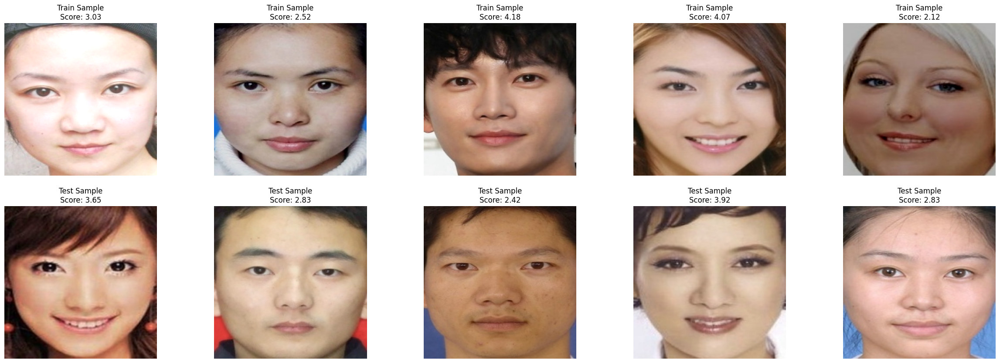

In [13]:
# Defining the train and test datasets 

train_dataset = SCUTDataset(df= train_df,  image_dir = image_folder, transform = transform_train)
test_dataset = SCUTDataset(df= test_df, image_dir = image_folder, transform = transform_test)

# Print the length of the datasets
print("Train dataset length:", len(train_dataset))
print("Test dataset length:", len(test_dataset))


fig, axs = plt.subplots(2,5, figsize = (30,10))

idxs = np.random.randint(0, len(train_dataset)+1,5)

for i, idx in enumerate(idxs):
    # Sample from train dataset
    sample_train_image,_, sample_train_score = train_dataset[idx]
    print(sample_train_image.shape)
    axs[0, i].imshow(np.transpose(sample_train_image,(1,2,0)))
    axs[0, i].set_title('Train Sample\nScore: {:.2f}'.format(sample_train_score))
    axs[0, i].axis('off')

idxs = np.random.randint(0, len(test_dataset)+1,5)
for i, idx in enumerate(idxs):
    # Sample from test dataset
    sample_test_image,_, sample_test_score = test_dataset[idx]
    axs[1, i].imshow(np.transpose(sample_test_image,(1,2,0)))
    axs[1, i].set_title('Test Sample\nScore: {:.2f}'.format(sample_test_score))
    axs[1, i].axis('off')

plt.show()

## Create DataLoader

### Instantiate dataloaders for the test and train sets. 

In [14]:
# Defining the train and test dataloaders 

# Define batch size for DataLoader
batch_size = 32

# Define train and test DataLoader objects
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

# Print the length of train and test DataLoader objects
print("Train DataLoader length:", len(train_dataloader))
print("Test DataLoader length:", len(test_dataloader))

Train DataLoader length: 103
Test DataLoader length: 69


### Visualize a batch (sanity check).

Batch 0


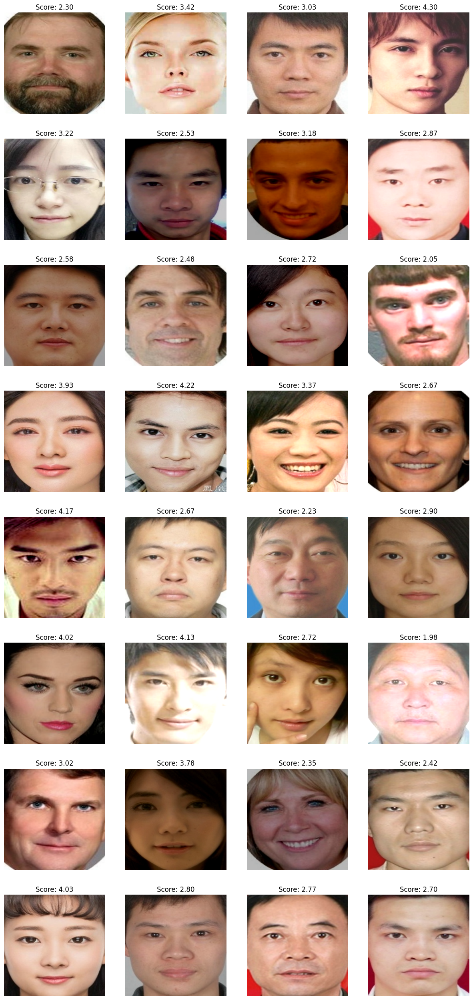

Batch 1


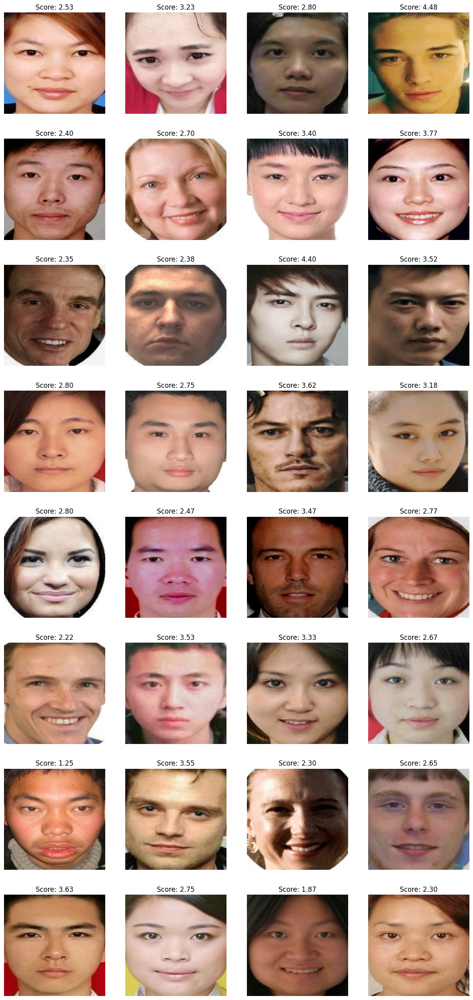

In [15]:
# Visualize a Batch

# Define a function to show images and scores
def show_batch(batch):
    images,_, scores = batch
    batch_size = len(images)
    num_cols = 4
    num_rows = (batch_size + num_cols - 1) // num_cols
    
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 4*num_rows))
    
    for i in range(batch_size):
        ax = axs[i // num_cols, i % num_cols]
        ax.imshow(np.transpose(images[i], (1,2,0)))
        ax.set_title('Score: {:.2f}'.format(scores[i]))
        ax.axis('off')
    
    plt.show()

# Test DataLoader output
for batch_idx, batch in enumerate(train_dataloader):
    print("Batch", batch_idx)
    show_batch(batch)
    if batch_idx == 1:  # Show only first few batches for testing
        break

## Define Model
### Defing the model as given in the paper. 
### The model consists of two branches - pretrained resnet50 and inceptionv3 followed by concatenated FC layer and a final FC layer.
<p align="center">
  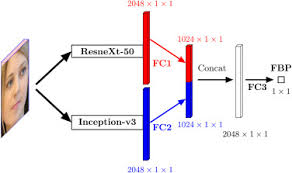
</p>


In [16]:
# Defining Model 
import torchvision
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()
    self.model1 = torchvision.models.resnext50_32x4d(pretrained=True)
    self.model1.fc = nn.Linear(2048, 1024)

    self.model2 = torchvision.models.inception_v3(pretrained=True)
    self.model2.fc = nn.Linear(2048, 1024)
    self.fc2 = nn.Linear(2048, 1)

  def forward(self, input1, input2):
    c = self.model1(input1)
    f = self.model2(input2)
    if self.training:
        l, ll = f
    else: 
        l = f
    combined = torch.cat((c,l), dim=1)

    out = self.fc2(F.relu(combined))
    return out

model = Model();

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device);

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNeXt50_32X4D_Weights.IMAGENET1K_V1`. You can also use `weights=ResNeXt50_32X4D_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnext50_32x4d-7cdf4587.pth" to /root/.cache/torch/hub/checkpoints/resnext50_32x4d-7cdf4587.pth
100%|██████████| 95.8M/95.8M [00:00<00:00, 148MB/s]
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated sin

## Defining the Loss Function 
### For this task, we will use the Dynamic parameterized SmoothL1 loss function for training and the Mean Absolute Error for evaluation.
### The Dynamic Smooth L1 loss function is given by:
#### $L_{\text{SmoothL1}} = \frac{1}{N} \sum_{i=1}^{N} z_i$
#### Where,
#### $z_i = \begin{cases}
0.5(y_i - \hat{y}_i)^2, & \text{if } |y_i - \hat{y}_i| \leq \alpha \\
|y_i - \hat{y}_i| + 0.5\alpha^2 - \alpha, & \text{otherwise}
\end{cases}
$
#### And $\alpha$ is given by,
#### $\alpha_{\text{cur}} = \alpha_{\text{min}} + \frac{1}{2} (\alpha_{\text{max}} - \alpha_{\text{min}}) \left(1 + \cos\left(\frac{e_{\text{cur}}}{n_e}\pi\right)\right)$

In [17]:
# Defining the loss function 

def dy_smooth_l1_loss(inputs, targets, beta):
    """
    Dynamic ParamSmoothL1 loss function
    
    """
    n = torch.abs(inputs - targets)
    cond = n < beta
    loss = torch.where(cond, 0.5 * n ** 2, n + 0.5 * beta**2 - beta)

    return loss.mean()


def MAE_distance(preds, labels):
    """
    Mean Absolute Error 
    
    """
    return torch.mean(torch.abs(preds - labels)) 

val_criterion = MAE_distance
criterion = dy_smooth_l1_loss

## Define Optimizer and Scheduler
### The optimizer used is Adam, with an initial lr of 0.0001 . 
### The lr is decayed by a factor of 0.1 after 20 and 30 epochs. 

In [18]:
optimizer = optim.Adam(model.parameters(), lr=0.0001)
scheduler = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[20, 30], gamma=0.1)


## Defining the Train Function 
### In this function, all batches inside the epoch are sequentially passed through the model to update its weight. 
### The loss function is the dynamic parameterized smooth L1 Loss. 

In [19]:
from tqdm import tqdm


def train(model, dataloader, criterion, optimizer, device, sigma):
    total_loss = 0
    for batch in tqdm(dataloader):        
        images1, images2, scores = batch
#         for i in range(images1.shape[0]):
#             print(images1[i].shape)
#             print(images2[i].shape)
        images1 = images1.float().to(device)
        images2 = images2.float().to(device)
        scores = scores.to(device)
        torch.set_grad_enabled(True)
        model.train()
        preds = model(images1, images2)

        loss = criterion(preds.squeeze(1), scores, sigma)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step() 

        total_loss += loss.item()            
          
        del images1; del images2; del scores    
        
    return total_loss / len(dataloader)


## Defining the Evaluation Function
### For evaluation, both the  dynamic parameterized smooth L1 Loss and MAE Loss are used 

In [20]:
def validate(model, dataloader, criterion, val_criterion, device, sigma):
    
    total_loss_val_mae = 0
    total_loss_val_mse = 0
    for batch in tqdm(dataloader): 
        images1, images2, labels = batch
        images1 = images1.float().to(device)
        images2 = images2.float().to(device)
        labels = labels.to(device)
        model.eval()
        with torch.no_grad():
            preds = model(images1, images2)
            
        total_loss_val_mse += criterion(preds.squeeze(1), labels, sigma)
        total_loss_val_mae += val_criterion(preds.squeeze(1), labels)
                 
        del images1; del images2; del labels
    return total_loss_val_mse / len(dataloader), total_loss_val_mae / len(dataloader)

## Train Loop 
### In the main train loop, the sigma values and lr are updated. The model with the best MAE performance of on the test set is stored.

In [21]:
import torch.nn.functional as F

num_epochs = 40
sigma_min, sigma_max = 0.3, 0.7
lowest_val_loss = 10**5

for epoch in range(num_epochs):
   
    sigma = sigma_min + (1/2)* (sigma_max - sigma_min ) * (1+ np.cos (np.pi * ((epoch+1)/ num_epochs)))                                                         
    epoch_train_loss = train(model, train_dataloader, criterion,optimizer, device, sigma)
    epoch_val_loss_mse, epoch_val_loss_mae = validate(model, test_dataloader,criterion, val_criterion, device, sigma)      
    if epoch_val_loss_mae < lowest_val_loss:
        lowest_val_loss = epoch_val_loss_mae
        torch.save(model.state_dict(), '/kaggle/working/model_weights.pth')
        
    scheduler.step()                                                         
    print(f"Epoch: {epoch}, Train Loss : {epoch_train_loss}, ValidLoss (MSE): {epoch_val_loss_mse}, ValidLoss (MAE): {epoch_val_loss_mae}")
                                                           
                                                           

100%|██████████| 69/69 [00:19<00:00,  3.47it/s]


Epoch: 0, Train Loss : 0.18562840239949596, ValidLoss (MSE): 0.06711985170841217, ValidLoss (MAE): 0.2789859473705292


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 1, Train Loss : 0.05434794398476776, ValidLoss (MSE): 0.08017411082983017, ValidLoss (MAE): 0.31773149967193604


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 2, Train Loss : 0.03913103553999975, ValidLoss (MSE): 0.05334280803799629, ValidLoss (MAE): 0.2515600025653839


100%|██████████| 69/69 [00:19<00:00,  3.50it/s]


Epoch: 3, Train Loss : 0.029919020515116093, ValidLoss (MSE): 0.049636781215667725, ValidLoss (MAE): 0.2440992146730423


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 4, Train Loss : 0.02451992636654996, ValidLoss (MSE): 0.049862079322338104, ValidLoss (MAE): 0.24338166415691376


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 5, Train Loss : 0.027369897532303934, ValidLoss (MSE): 0.06033075228333473, ValidLoss (MAE): 0.27216723561286926


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 6, Train Loss : 0.020435686440216105, ValidLoss (MSE): 0.07337493449449539, ValidLoss (MAE): 0.310869961977005


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 7, Train Loss : 0.022332389052342444, ValidLoss (MSE): 0.049030933529138565, ValidLoss (MAE): 0.23515945672988892


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 8, Train Loss : 0.01710493245062608, ValidLoss (MSE): 0.055397480726242065, ValidLoss (MAE): 0.25304147601127625


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 9, Train Loss : 0.01804246785101092, ValidLoss (MSE): 0.048889096826314926, ValidLoss (MAE): 0.23206005990505219


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 10, Train Loss : 0.01465758953008403, ValidLoss (MSE): 0.055924467742443085, ValidLoss (MAE): 0.2477545291185379


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 11, Train Loss : 0.01485479082821787, ValidLoss (MSE): 0.054128099232912064, ValidLoss (MAE): 0.2513519525527954


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 12, Train Loss : 0.01549049493296126, ValidLoss (MSE): 0.059611059725284576, ValidLoss (MAE): 0.2643496096134186


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 13, Train Loss : 0.014166409642553156, ValidLoss (MSE): 0.05039602890610695, ValidLoss (MAE): 0.24267515540122986


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 14, Train Loss : 0.01562646459516825, ValidLoss (MSE): 0.04672372341156006, ValidLoss (MAE): 0.23044441640377045


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 15, Train Loss : 0.013122451658930305, ValidLoss (MSE): 0.0627792477607727, ValidLoss (MAE): 0.27228209376335144


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 16, Train Loss : 0.012454316856393826, ValidLoss (MSE): 0.047581661492586136, ValidLoss (MAE): 0.2315073311328888


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 17, Train Loss : 0.01106340049775046, ValidLoss (MSE): 0.04860066622495651, ValidLoss (MAE): 0.2318897843360901


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 18, Train Loss : 0.015054387194149702, ValidLoss (MSE): 0.04833943769335747, ValidLoss (MAE): 0.23040595650672913


100%|██████████| 69/69 [00:19<00:00,  3.50it/s]


Epoch: 19, Train Loss : 0.00923052285255376, ValidLoss (MSE): 0.047232721000909805, ValidLoss (MAE): 0.22169312834739685


100%|██████████| 69/69 [00:19<00:00,  3.54it/s]


Epoch: 20, Train Loss : 0.0073527637236181975, ValidLoss (MSE): 0.04727070406079292, ValidLoss (MAE): 0.21989962458610535


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 21, Train Loss : 0.0054524509638584065, ValidLoss (MSE): 0.047447025775909424, ValidLoss (MAE): 0.21959224343299866


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 22, Train Loss : 0.005201149699097337, ValidLoss (MSE): 0.04780218005180359, ValidLoss (MAE): 0.21826577186584473


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 23, Train Loss : 0.004411519428226844, ValidLoss (MSE): 0.04923645406961441, ValidLoss (MAE): 0.22035135328769684


100%|██████████| 69/69 [00:19<00:00,  3.53it/s]


Epoch: 24, Train Loss : 0.004029616073804717, ValidLoss (MSE): 0.05004441365599632, ValidLoss (MAE): 0.21927303075790405


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 25, Train Loss : 0.004290661497665479, ValidLoss (MSE): 0.05131387710571289, ValidLoss (MAE): 0.21913664042949677


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 26, Train Loss : 0.0037919686377066576, ValidLoss (MSE): 0.051527731120586395, ValidLoss (MAE): 0.2186361402273178


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 27, Train Loss : 0.00412680301363173, ValidLoss (MSE): 0.05405666306614876, ValidLoss (MAE): 0.21912869811058044


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 28, Train Loss : 0.0037875992485584273, ValidLoss (MSE): 0.05479953810572624, ValidLoss (MAE): 0.2193078249692917


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 29, Train Loss : 0.00384509245451377, ValidLoss (MSE): 0.05615324527025223, ValidLoss (MAE): 0.218469500541687


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 30, Train Loss : 0.003332509984741512, ValidLoss (MSE): 0.05676973611116409, ValidLoss (MAE): 0.2191983461380005


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 31, Train Loss : 0.0032980607515110554, ValidLoss (MSE): 0.05900948494672775, ValidLoss (MAE): 0.21934100985527039


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 32, Train Loss : 0.002924329858924289, ValidLoss (MSE): 0.059969212859869, ValidLoss (MAE): 0.21931421756744385


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 33, Train Loss : 0.0031100887685417407, ValidLoss (MSE): 0.06123775616288185, ValidLoss (MAE): 0.21908679604530334


100%|██████████| 69/69 [00:19<00:00,  3.51it/s]


Epoch: 34, Train Loss : 0.0030002827214719095, ValidLoss (MSE): 0.062214445322752, ValidLoss (MAE): 0.21982342004776


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 35, Train Loss : 0.003247971192128884, ValidLoss (MSE): 0.06267546862363815, ValidLoss (MAE): 0.21942263841629028


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 36, Train Loss : 0.003413543236233945, ValidLoss (MSE): 0.0631573423743248, ValidLoss (MAE): 0.2188636213541031


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 37, Train Loss : 0.0033228319902334686, ValidLoss (MSE): 0.06448733061552048, ValidLoss (MAE): 0.22061364352703094


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]


Epoch: 38, Train Loss : 0.002761464512305678, ValidLoss (MSE): 0.06393882632255554, ValidLoss (MAE): 0.21873673796653748


100%|██████████| 69/69 [00:19<00:00,  3.52it/s]

Epoch: 39, Train Loss : 0.002904439851917435, ValidLoss (MSE): 0.06429113447666168, ValidLoss (MAE): 0.21937160193920135


## Results
### After Training the model for 40 epochs, the following results were obtained:

In [22]:
print(f"Lowest MAE loss: {lowest_val_loss}")

Lowest MAE loss: 0.21826577186584473


### These results closely parallel those presented in the research paper.
### Given below is a visualization of the model's predictions on a batch in the test set.

In [23]:
# visualizing the the output 

model = Model()
model.load_state_dict(torch.load('/kaggle/working/model_weights.pth'))
model.to(device)

Model(
  (model1): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32, bias=False)
        (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(128, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

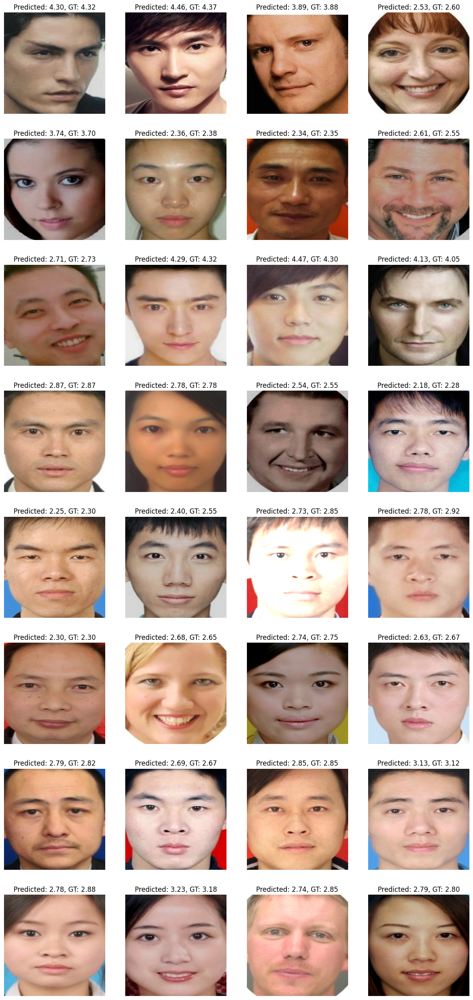

In [24]:
for batch in train_dataloader:
    images1, images2, labels = batch
    images1 = images1.float().to(device)
    images2 = images2.float().to(device)
    labels = labels.to(device)
    model.eval()
    with torch.no_grad():
        preds = model(images1, images2)
        
    preds = preds.detach().cpu().numpy()
    labesls = labels.detach().cpu().squeeze()
    
    images1 = images1.detach().cpu().numpy()
    
    
    
    num_cols = 4
    num_rows = (batch_size + num_cols - 1) // num_cols
    
    fig, axs = plt.subplots(num_rows, num_cols, figsize=(15, 4*num_rows))
    
    for i in range(batch_size):
        
        image = images1[i,:,:,:]
        image = np.transpose(image, (1,2,0))
        ax = axs[i // num_cols, i % num_cols]
        ax.imshow(np.transpose(images1[i], (1,2,0)))
        ax.set_title(f'Predicted: {preds[i][0]:.2f}, GT: {labels[i]:.2f}')
        ax.axis('off')
    
    plt.show()
    break
    

## Additional 
### Pulled a few images of celebreties from the internet to see the model's predictions 

In [25]:
# Imports 
import requests
from PIL import Image
from io import BytesIO


# List of urls 

image_urls = {"Kim Kardashian": "https://i.pinimg.com/originals/da/8f/dd/da8fdd56c0c8af4436910d3be9784e7b.jpg",
              "Brad Pitt": "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQsiFnXqDx8MXjryh0or--Ue1Kfhk8_HyLq1q4-qWzJ4A&s",
              "Anne Hathaway" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQEws9fFWFqx1NmN65aF9SwuSj6qJX6EhUKA_M-jDJswA&s",
              "Tilda Swinton" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcRXuWSyUbaN8C4OlzBzlSeRkMNZpiIZ9a4aUfdoGZCNtA&s",
              "Willen Defoe" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcQ6Z886QaVxYkOulCQrT0T5Zk1vH24lI4w_AWRBTqzVnA&s",
              "Robert Downey Jr" : "https://i.pinimg.com/474x/a7/1b/89/a71b895dd5a4b54f2d174499e4cf7520.jpg",
              "Lisa" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTeZIm0UE9hYecHsyXBXUSJUbHLFyUcr7BwTYtYhh-tPrahbP4c-_X5w26ebNvoXrn2lcw&usqp=CAU", 
              "Jackie Chan" : "https://i.pinimg.com/236x/ac/4b/75/ac4b7570861dba50533db4eb69029a57.jpg", 
              "Smoking Lady" : "https://encrypted-tbn0.gstatic.com/images?q=tbn:ANd9GcTpHEFY2fFNdVoxJ_gXpouK_Eati2t2IHZjk3aXc63Tbeu9UOGwyRPvWLoFGUFZDyzUUtw&usqp=CAU"
             }

def load_image(url):
    response = requests.get(url)
    image = Image.open(BytesIO(response.content))
    image1 = image.resize((256, 256))  # Resize to match model input size
    image1 = np.transpose(np.array(image1) / 255.0, (2,0,1))  # Normalize pixel values
    image2 = image.resize((299, 299))  # Resize to match model input size
    image2 = np.transpose(np.array(image2) / 255.0, (2,0,1))  # Normalize pixel values
    
    return image1, image2

images1 = np.zeros((9, 3, 256, 256))
images2 = np.zeros((9, 3, 299, 299))
i = 0
for name, url in image_urls.items():
    image1, image2 = load_image(url)
    images1[i, :, :, :] = image1
    images2[i,:,:,:] = image2
    i+= 1 

images1 = torch.tensor(images1).float().to(device)
images2 = torch.tensor(images2).float().to(device)
    
output = model(images1, images2)
output = output.detach().cpu().numpy()

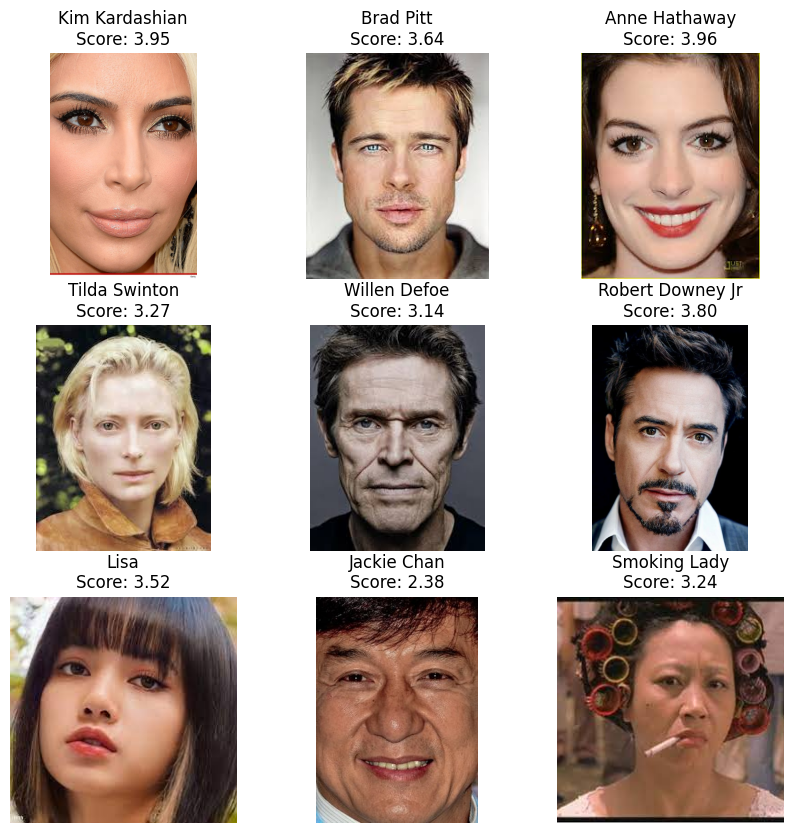

In [26]:
# Visualize the outputs 

fig, axs = plt.subplots(3,3, figsize=(10,10))

count  = 0
for name, url in image_urls.items():
    response = requests.get(url)
    image = np.array(Image.open(BytesIO(response.content)))
    axs[count// 3, count % 3].imshow(np.array(image))
    axs[count// 3, count % 3].set_title('{}\nScore: {:.2f}'.format(name, output[count][0]))
    axs[count// 3, count % 3].axis('off')
    count += 1 
